In [1]:
import gym
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import numpy as np
import timebudget
from tqdm.auto import tqdm
timebudget.set_quiet()

In [2]:
import rltrain
from importlib import reload
reload(rltrain)
import helpers
reload(helpers)

<module 'helpers' from '/Users/leodirac/dev/jasrlp/helpers.py'>

In [3]:
class DrunkCartPole():
    
    def __init__(self):
        e = gym.make('CartPole-v0')
        self.env = e
        self.reset = e.reset
        self.render = e.render
        self.close = e.close
        self.action_space = e.action_space
        self.observation_space = e.observation_space

    def step(self, action):
        obs, reward, is_done, info = self.env.step(action)
        angle = obs[2]
        if max(angle,-angle) < 1:
            # give bonus points for being off center.  Ha!
            reward += 10 * angle ** 2
        return obs, reward, is_done, info
        

In [4]:
#env = gym.make('CartPole-v0')
env = DrunkCartPole()
learner = rltrain.DQN(env, gamma=0.99, lr=1e-3, net_args={'hidden_dims': [32,32], 'activation': nn.Tanh})
learner.show_loss_every = 1000
learner.copy_to_target_every = 300
learner.minibatch_size = 128
viz = helpers.CartPoleViz(learner)
#viz = helpers.MountainCarViz(learner)


Creating FCNet with 4->2 dims for 4 observations and 2 actions


2238


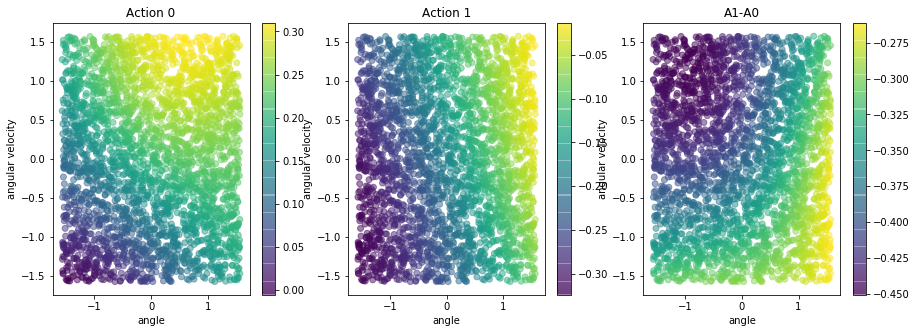

6358


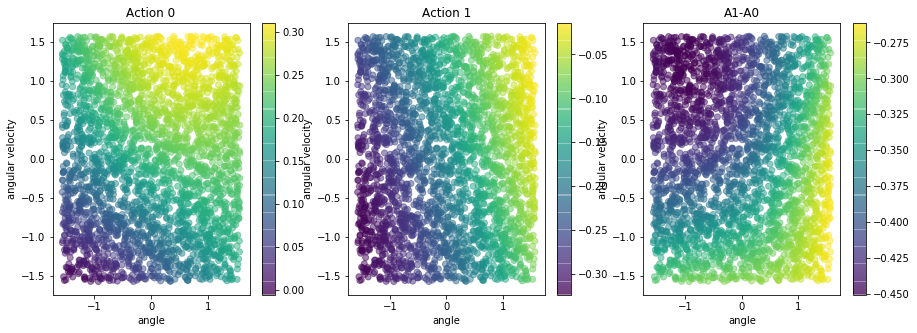

/Users/leodirac/dev/jasrlp/rldqn.py:151: UserWarning: calc_qval_batch can usually be replaced with just forward()
  warnings.warn("calc_qval_batch can usually be replaced with just forward()")


Loss = 0.78700
10717


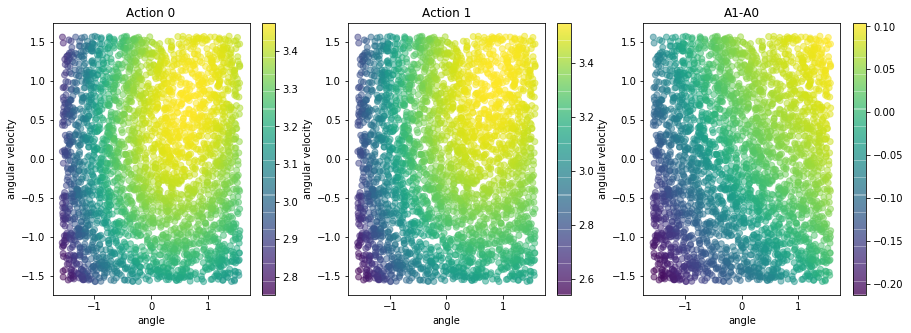

Loss = 0.04519
Loss = 0.03823



In [5]:
learner.eps = 1
for i in tqdm(range(600), "random warmup"):
    learner.rollout()
    if i % 200 == 99:
        print(len(learner._replay))
        viz.plot_q()

In [6]:
def eps_range(N:int=10, start:float=0.99, end:float=0.01, exp:float=1.0) -> list:
    start1 = start ** (1/exp)
    end1 = end ** (1/exp)
    change = end1-start1
    current = start1
    for i in range(N):
        eps = current ** exp
        print(f"\n\nEps = {eps:.3f} on {i+1} of {N}")
        yield eps
        current += (change)/(N-1)
        



Eps = 0.900 on 1 of 20


Loss = 0.61373
Loss = 0.29780
Loss = 0.74170



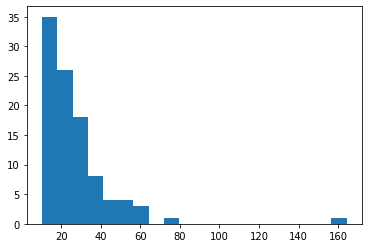

Reward mean,std = 27.134 +/- 18.771


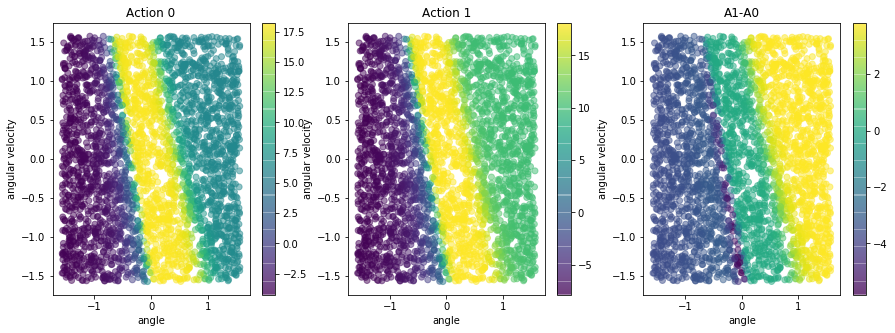



Eps = 0.768 on 2 of 20


Loss = 0.69808
Loss = 0.32315



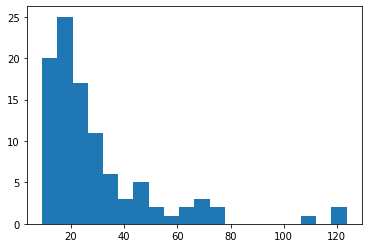

Reward mean,std = 29.586 +/- 22.113


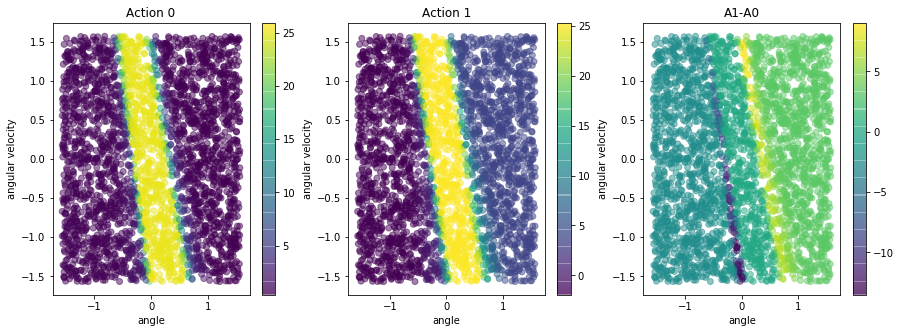



Eps = 0.652 on 3 of 20


Loss = 0.28847
Loss = 0.61555



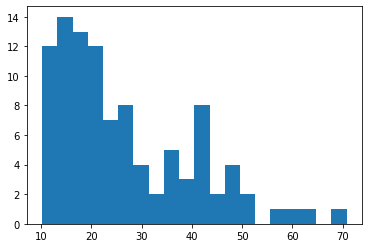

Reward mean,std = 26.644 +/- 13.249


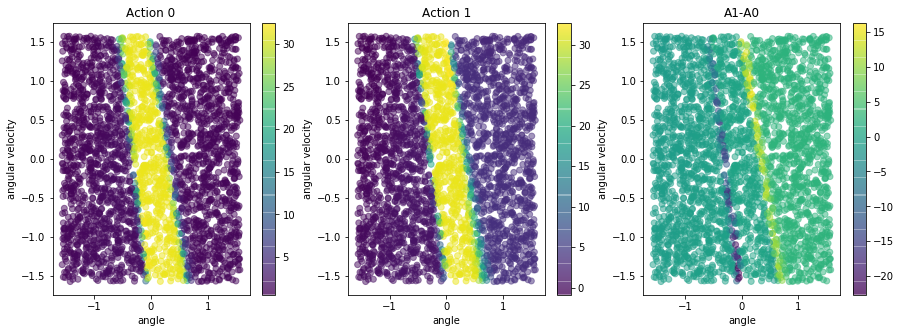



Eps = 0.550 on 4 of 20


Loss = 0.21353
Loss = 0.13261
Loss = 0.48173



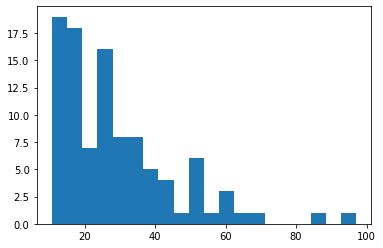

Reward mean,std = 29.245 +/- 16.632


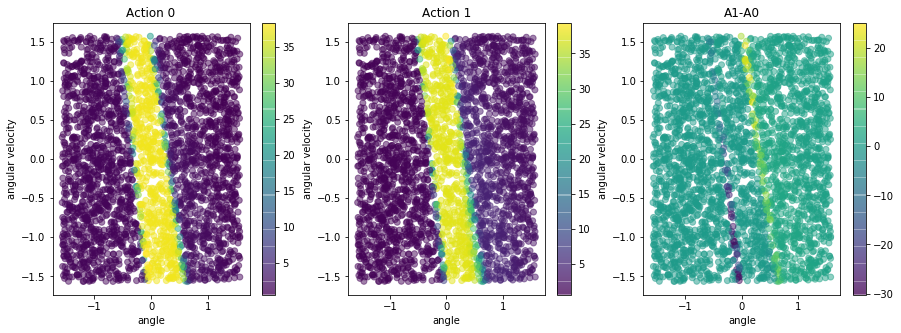



Eps = 0.462 on 5 of 20


Loss = 0.13716
Loss = 0.57625



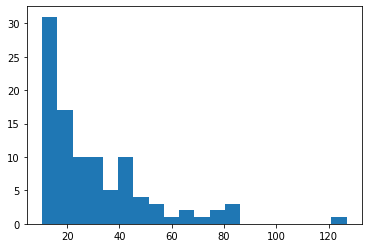

Reward mean,std = 30.492 +/- 20.723


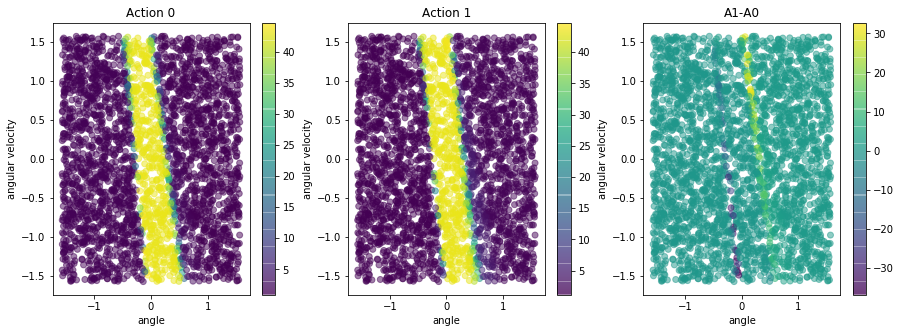



Eps = 0.385 on 6 of 20


Loss = 0.62486
Loss = 0.63398
Loss = 0.20237



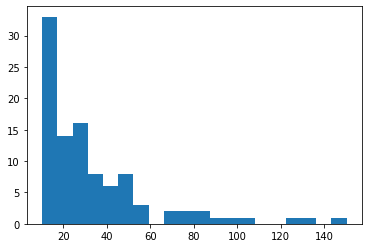

Reward mean,std = 34.165 +/- 27.246


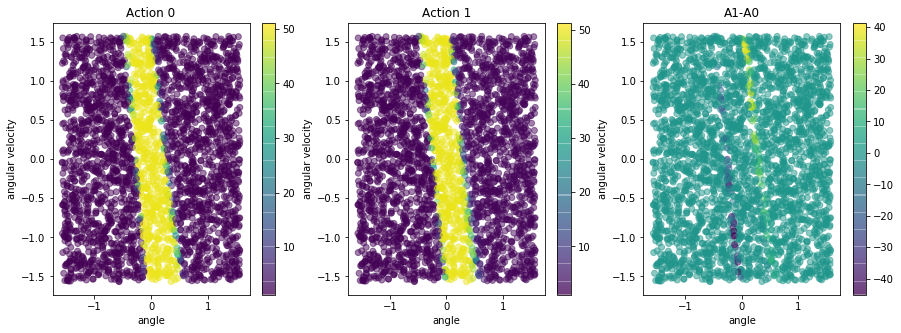



Eps = 0.319 on 7 of 20


Loss = 1.17655
Loss = 0.39046
Loss = 0.74468
Loss = 0.59320



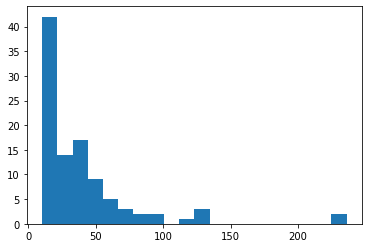

Reward mean,std = 39.551 +/- 38.770


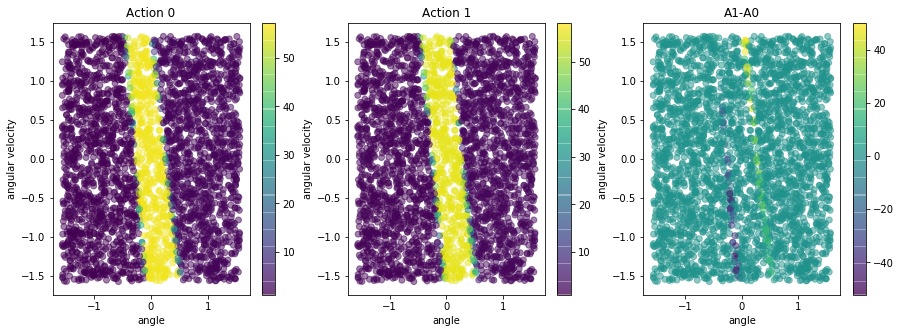



Eps = 0.262 on 8 of 20


Loss = 0.63861
Loss = 0.26102
Loss = 1.12771
Loss = 0.11921



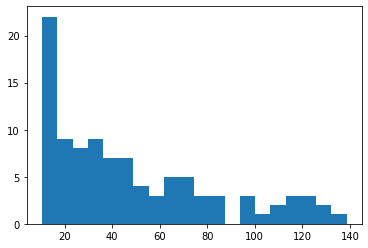

Reward mean,std = 48.691 +/- 34.758


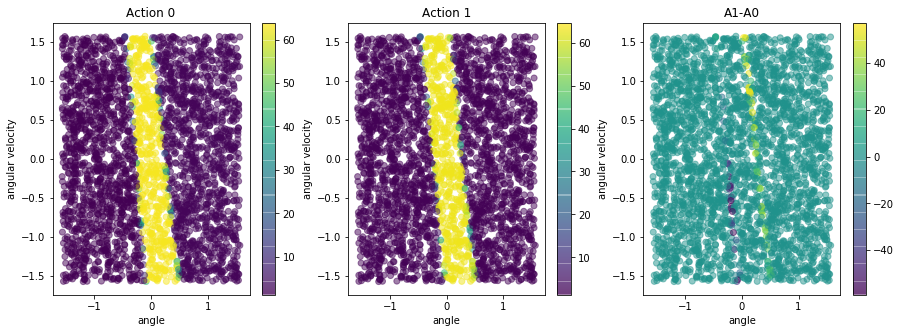



Eps = 0.214 on 9 of 20


Loss = 0.46245
Loss = 0.71172
Loss = 0.42239
Loss = 1.12028



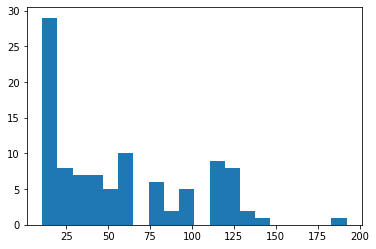

Reward mean,std = 57.973 +/- 42.275


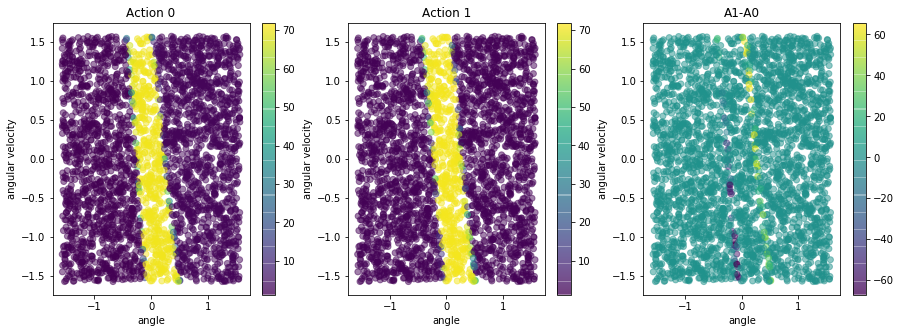



Eps = 0.173 on 10 of 20


Loss = 0.77816
Loss = 1.69768
Loss = 0.18678
Loss = 0.46094
Loss = 0.06581



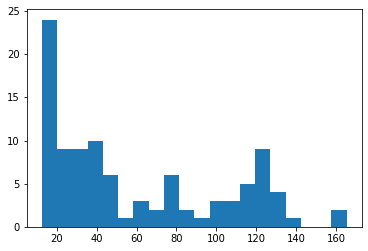

Reward mean,std = 59.598 +/- 43.588


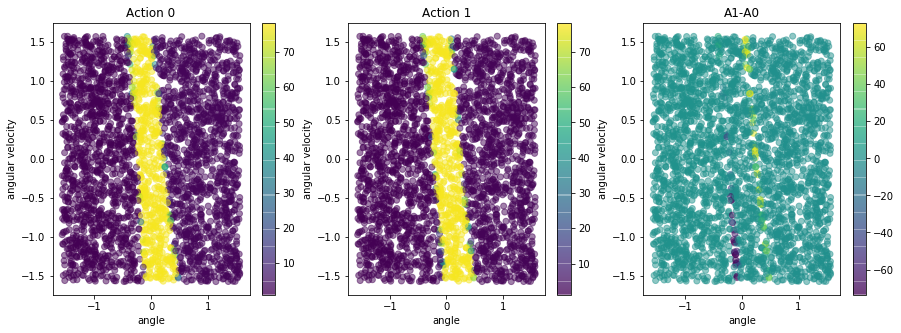



Eps = 0.138 on 11 of 20


Loss = 0.10630
Loss = 0.13108
Loss = 0.08200
Loss = 0.16401
Loss = 0.18300
Loss = 0.71182



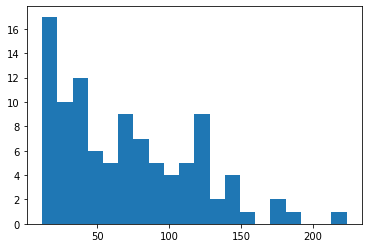

Reward mean,std = 70.381 +/- 46.948


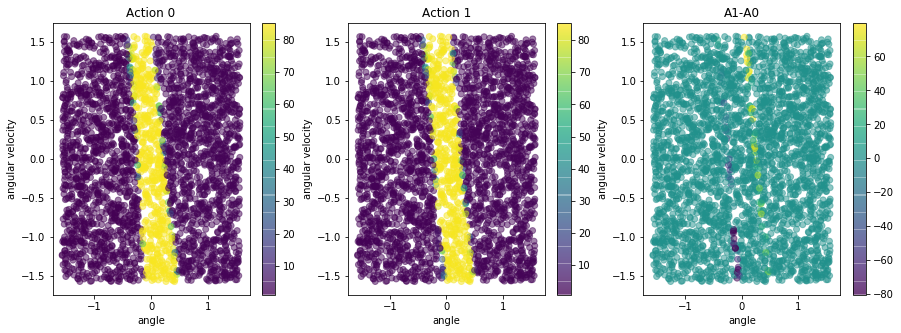



Eps = 0.110 on 12 of 20


Loss = 1.88191
Loss = 0.17523
Loss = 0.74116
Loss = 0.44125
Loss = 1.96467
Loss = 0.16542
Loss = 0.27321



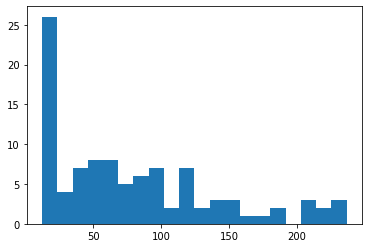

Reward mean,std = 79.401 +/- 61.809


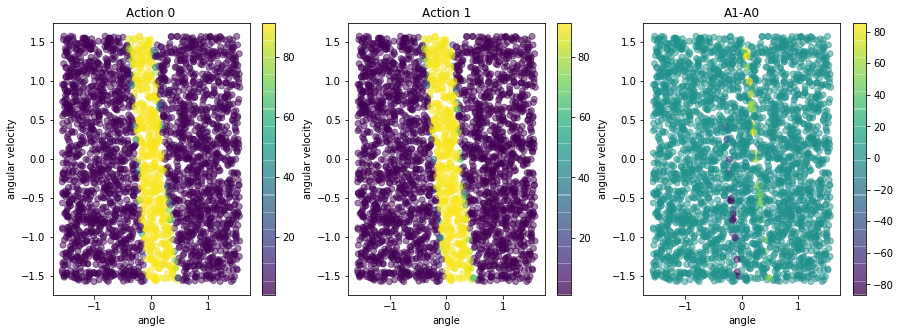



Eps = 0.086 on 13 of 20


Loss = 0.16074
Loss = 0.80843
Loss = 0.23945
Loss = 0.20711
Loss = 0.13604
Loss = 0.05938



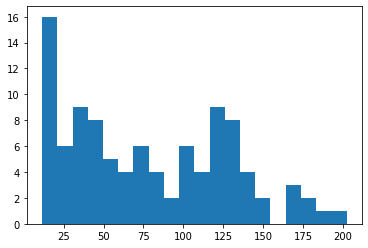

Reward mean,std = 78.539 +/- 50.094


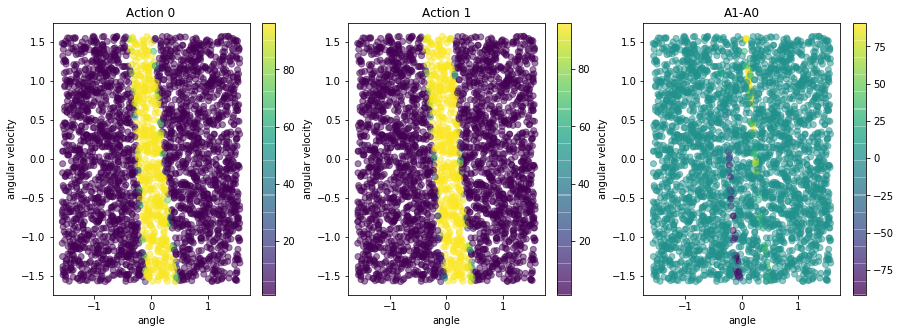



Eps = 0.067 on 14 of 20


Loss = 0.14274
Loss = 0.11476
Loss = 0.89373
Loss = 0.08118
Loss = 0.14014
Loss = 0.95418
Loss = 0.14417
Loss = 0.08308



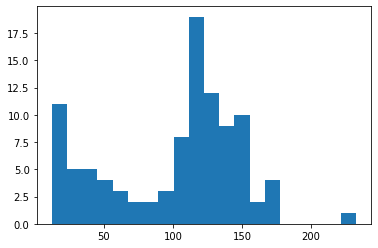

Reward mean,std = 100.721 +/- 48.879


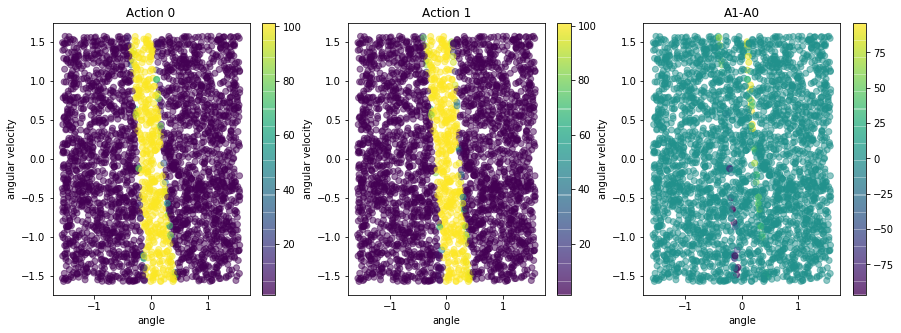



Eps = 0.051 on 15 of 20


Loss = 0.10818
Loss = 1.01079
Loss = 0.88217
Loss = 0.08283
Loss = 0.15628
Loss = 0.16668
Loss = 0.13729
Loss = 0.38947
Loss = 0.20029



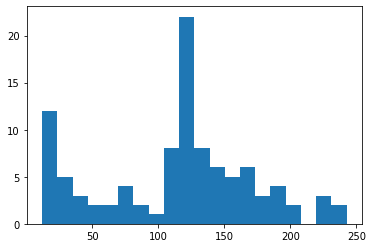

Reward mean,std = 113.603 +/- 58.762


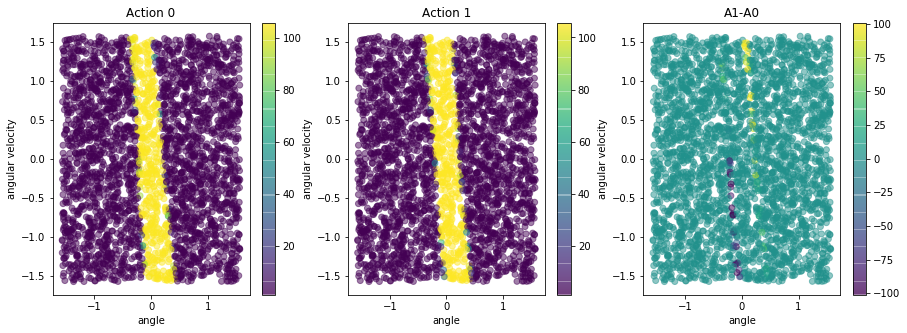



Eps = 0.038 on 16 of 20


Loss = 0.13742
Loss = 0.05077
Loss = 0.13687
Loss = 0.19316
Loss = 0.39438
Loss = 1.60547
Loss = 0.30308
Loss = 0.03952
Loss = 0.13432
Loss = 0.10519



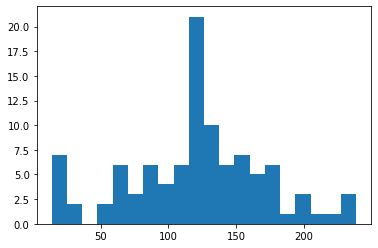

Reward mean,std = 120.847 +/- 50.366


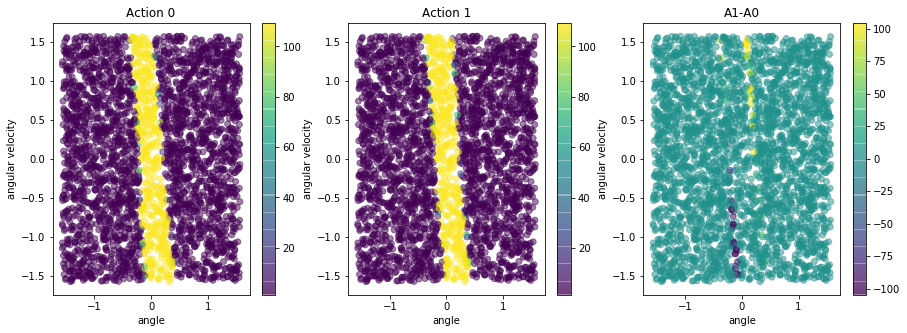



Eps = 0.028 on 17 of 20


Loss = 0.24562
Loss = 0.09738
Loss = 0.95507
Loss = 0.04234
Loss = 0.92905
Loss = 0.26437
Loss = 0.20308
Loss = 0.95947
Loss = 0.88805
Loss = 0.93141
Loss = 1.00943



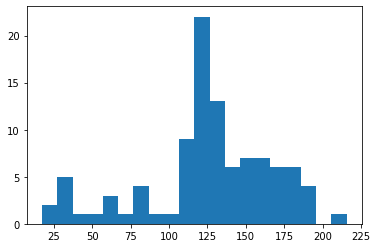

Reward mean,std = 125.850 +/- 42.012


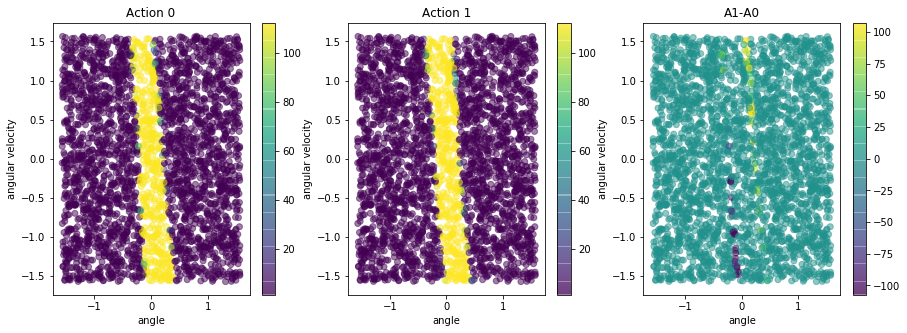



Eps = 0.020 on 18 of 20


Loss = 1.00768
Loss = 0.42351
Loss = 0.03605
Loss = 0.40031
Loss = 0.49741
Loss = 1.90791
Loss = 1.00266
Loss = 0.27435
Loss = 0.26995
Loss = 0.03160
Loss = 0.02752



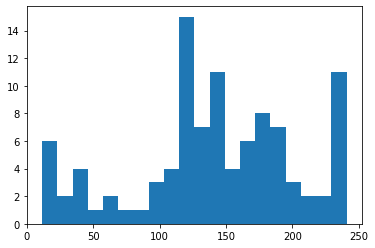

Reward mean,std = 140.811 +/- 60.394


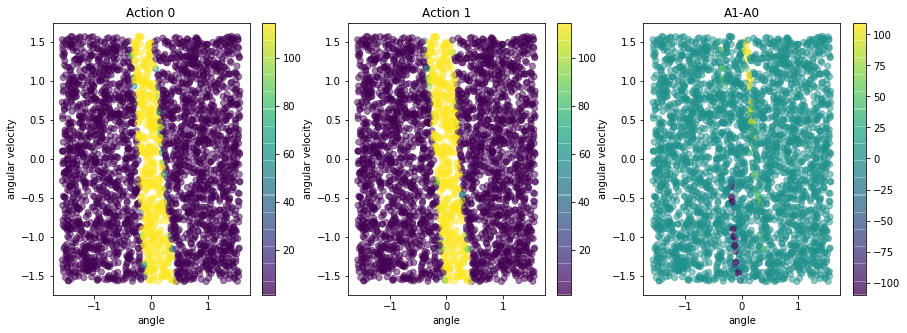



Eps = 0.014 on 19 of 20


Loss = 0.17712
Loss = 1.06193
Loss = 0.19842
Loss = 0.20782
Loss = 0.11717
Loss = 2.56336
Loss = 1.10360
Loss = 0.91875
Loss = 0.58254
Loss = 2.65634
Loss = 2.14875
Loss = 0.17420
Loss = 2.70063
Loss = 2.92252
Loss = 1.09350



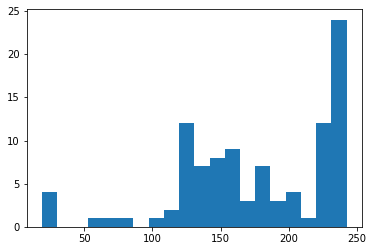

Reward mean,std = 174.424 +/- 56.099


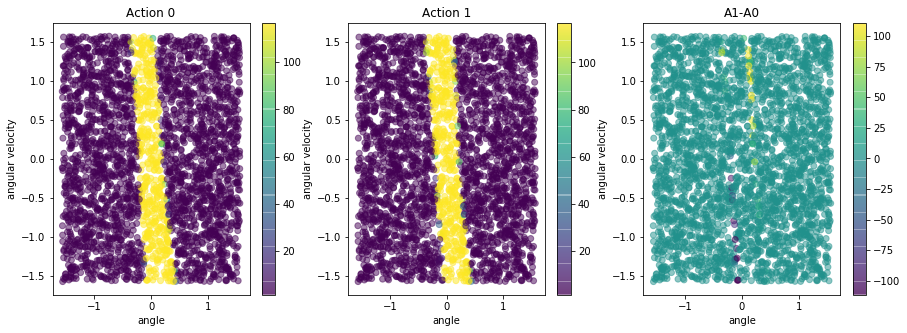



Eps = 0.010 on 20 of 20


Loss = 0.94335
Loss = 0.63965
Loss = 0.11643
Loss = 0.94810
Loss = 1.13408
Loss = 0.96894
Loss = 0.10792
Loss = 0.95133
Loss = 0.05533
Loss = 1.01575
Loss = 1.21429
Loss = 0.04128
Loss = 0.92938
Loss = 0.76657
Loss = 0.42913



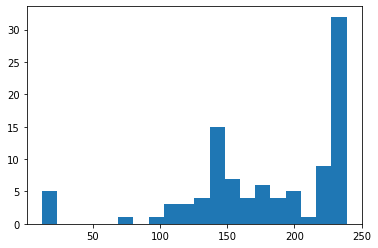

Reward mean,std = 178.051 +/- 57.373


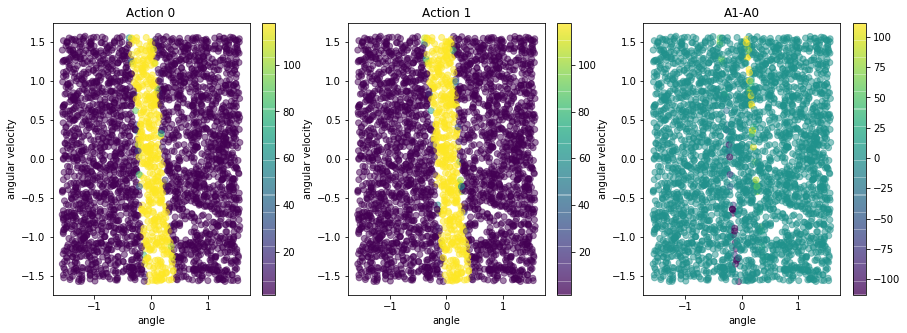

In [7]:
for eps in eps_range(N=20, start=0.9, end=0.01, exp=5):
    _ = helpers.rollout_score_dist(learner, eps, n=100)
    viz.plot_q()

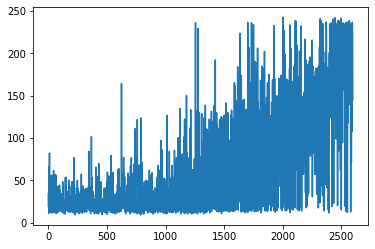

In [8]:
viz.plot_history()

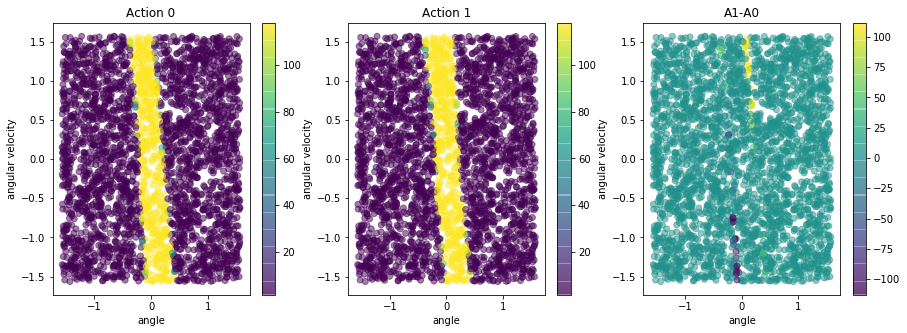

In [9]:
viz.plot_q()

Loss = 1.89666



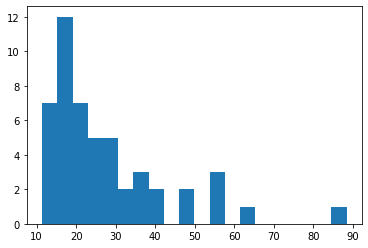

Reward mean,std = 27.837 +/- 15.716


In [10]:
# check random
_ = helpers.rollout_score_dist(learner, 1, n=50)

Loss = 2.73934
Loss = 0.94364
Loss = 1.84537
Loss = 0.01549
Loss = 0.94121
Loss = 0.93099
Loss = 0.99729
Loss = 1.83046
Loss = 0.02659



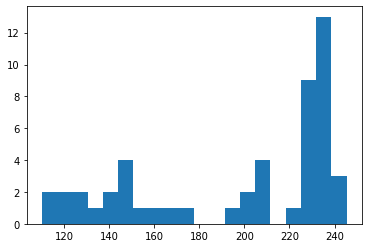

Reward mean,std = 197.772 +/- 43.770


In [11]:
# check greedy
_ = helpers.rollout_score_dist(learner, 0, n=50)

In [12]:
timebudget.report('rollout')

timebudget report per rollout cycle...
                  rollout: 100.0%   138.77ms/cyc @     1.0 calls/cyc
              do_learning:  91.4%   126.77ms/cyc @    56.3 calls/cyc
                optimizer:  39.0%    54.10ms/cyc @    52.7 calls/cyc
                   sample:  31.0%    43.07ms/cyc @    52.7 calls/cyc
                 q_target:   9.0%    12.51ms/cyc @    52.7 calls/cyc
         rollout-forwards:   8.3%    11.51ms/cyc @    57.3 calls/cyc


In [13]:
learner.eps=0
learner.rollout(render=True)

(95, 120.7803357208318)